In [ ]:
!pip install pinecone-client datasets torch

In [1]:
import pinecone

pinecone.init(
    api_key="<<YOUR_API_KEY>>",
    environment="us-west1-gcp"
)
index = pinecone.Index("imagenet-query-trainer-clip")

In [2]:
from datasets import load_dataset

imagenet = load_dataset(
    'frgfm/imagenette',
    'full_size',
    split='train',
    ignore_verifications=False  # set to True if seeing splits Error
)

Reusing dataset imagenette (/Users/jamesbriggs/.cache/huggingface/datasets/frgfm___imagenette/full_size/1.0.0/38929285b8abcae5c1305418e9d8fea5dd6b189bbbd22caba5f5537c7fa0f01f)


We will start with a generic query, emulating that we don't really know what we're looking for. To create the embedding from that we need to use the natural language part of OpenAI's CLIP.

In [3]:
from transformers import CLIPTokenizerFast, CLIPModel

model_id = "openai/clip-vit-base-patch32"

tokenizer = CLIPTokenizerFast.from_pretrained(model_id)
model = CLIPModel.from_pretrained(model_id)

prompt = "a radio"

inputs = tokenizer(prompt, return_tensors="pt")
out = model.get_text_features(**inputs)
out.shape

torch.Size([1, 512])

As with our image embeddings, we get a `1, 512` dimension tensor. We perform the same steps to prepare it as a query vector `xq` for Pinecone.

In [4]:
out = out.squeeze(0)
out.shape

torch.Size([512])

In [5]:
import torch

xq = out.cpu().detach().numpy().tolist()
len(xq)

512

We retrieve `10` of the most similar records and store them in `xc`:

In [6]:
xc = index.query(xq, top_k=10, include_values=True)

`xc` contains more than just the vectors, it is a JSON object in the format:

```json
{
    'matches': [
        {
            'id': '<<ID of retrieved item #1>>',
            'score': 0.53,  # float value similarity score
            'values': [-0.22, 0.21, ...],  # the vector embedding itself
        },
        {
            'id': '<<ID of retrieved item #2>>',
            'score': 0.41,
            'values': [-0.19, 0.29, ...],
        },
        ...  # this continues for the 10 records we've returned
    ],
    'namespace': ''
}
```

We don't need all of this information, all we need are the ID values that we will convert to index values for extracting and displaying the images themselves, and the vectors for training the model.

In [7]:
# get the index values
idx = [int(match['id']) for match in xc['matches']]
idx

[983, 707, 52, 498, 117, 571, 236, 278, 373, 200]

In [8]:
# get the vectors
values = [match['values'] for match in xc['matches']]

Now we can see what these returned images look like.

983


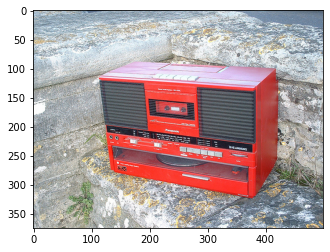

707


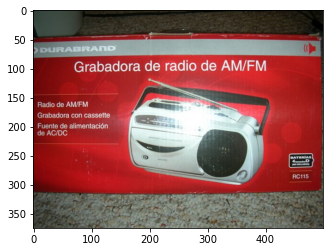

52


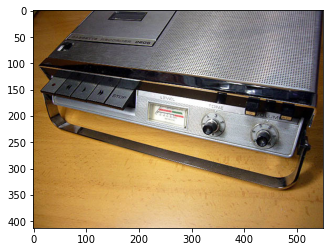

498


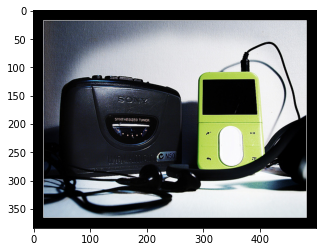

117


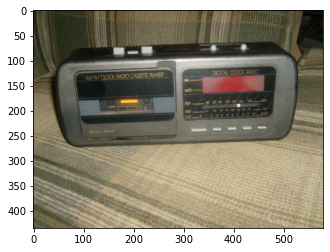

571


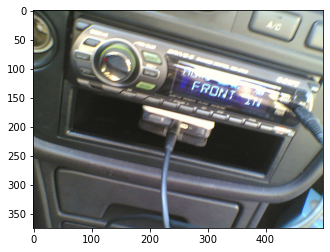

236


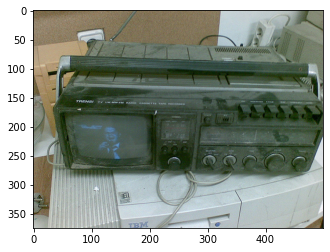

278


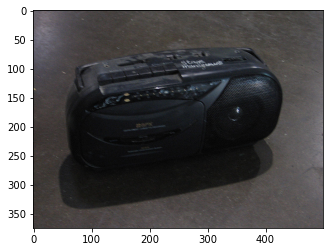

373


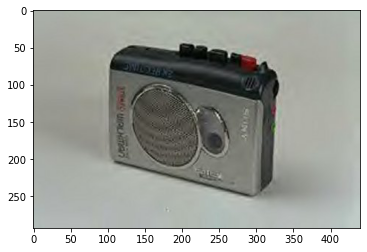

200


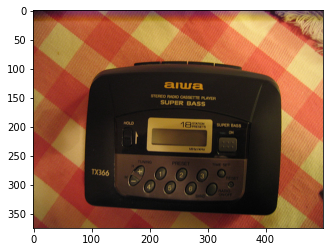

In [9]:
import matplotlib.pyplot as plt

for i in idx:
    print(i)
    plt.imshow(imagenet[i]['image'])
    plt.show()

I want to find the boombox style sony radio from the previous 00-indexer-clip.ipynb notebook TK link. To do that, I need to set radios that I think most resemble that radio as positives, and everything else as negatives.

In [10]:
positives = []
negatives = [i for i in idx if i not in positives]

Now we extract the vector values extracted from Pinecone during the `query`, and prepare both these input values `X` and also some target labels `y`. We will use these to train our linear classifier.

In [11]:
# we need to extract the embeddings of the positives and negatives
positives = [
    match['values'] for match in xc['matches'] if int(match['id']) in positives
]
negatives = [
    match['values'] for match in xc['matches'] if int(match['id']) in negatives
]

In [12]:
# create the training inputs
X = positives + negatives
len(X)

10

We only have two labels, `0` for irrelevant, and `1` for relevant.

In [13]:
# and create our labels (in this case only zeros)
y = [1] * len(positives) + [0] * len(negatives)
y  # these are our target labels

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

We will use a linear classifier model to learn the "perfect query" based on our selections. For this we will use a linear layer from PyTorch, find [install instructions for PyTorch here](https://pytorch.org), or just do following (not recommended):

```
!pip install torch
```

In [14]:
import torch

# initialize the model with 512 input size and one output
model = torch.nn.Linear(512, 1)

# convert previous query `xq` to tensor paramater for initial model weights
init_weight = torch.Tensor(xq).reshape(1, -1)
model.weight = torch.nn.Parameter(init_weight)

# init loss and optimizer
loss = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.2)

Now we have our model and first training batch ready, we can perform a training loop with our classifier, which we will define in a function called `fit`:

In [15]:
from tqdm.auto import tqdm

model.train()  # switch model to training mode

def fit(X: list, y: list, iters: int = 10):
    with tqdm(total=iters) as pbar:
        for _ in range(iters):
            # get predictions
            out = model(torch.Tensor(X))
            # calculate loss
            loss_value = loss(out, torch.Tensor(y).reshape(-1, 1))
            # reset gradients
            optimizer.zero_grad()
            # backpropagate
            loss_value.backward()
            # update weights
            optimizer.step()
            pbar.update(1)
            pbar.set_postfix(loss=loss_value.item())

In [16]:
# train
fit(X, y)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


  0%|          | 0/10 [00:00<?, ?it/s]

Now we extract a new query vector from the model weights:

In [17]:
model.weight.shape

torch.Size([1, 512])

We need to convert this to a flat list for Pinecone:

In [18]:
xq = model.weight.detach().numpy()[0].tolist()

Now before we search again we must mark the already retrieved vectors so that we don't retrieve them again. We do this using metadata filtering in Pinecone.

In [19]:
# we must update one record at a time
for i in idx:
    index.update(str(i), set_metadata={"seen": 1})

Now search using the new query vector.

4759


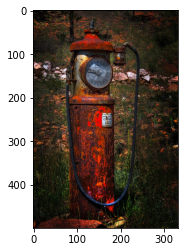

8974


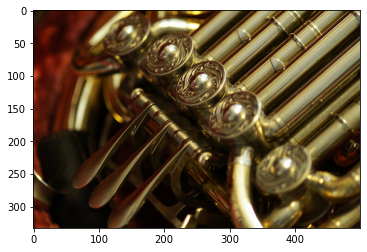

9097


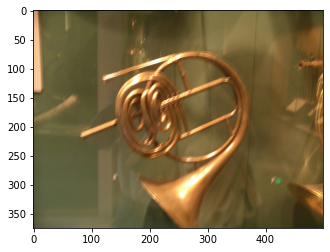

1662


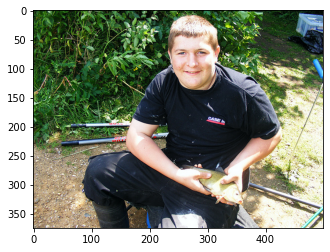

7662


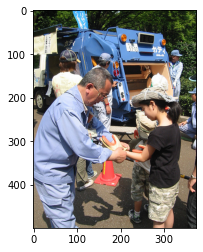

2702


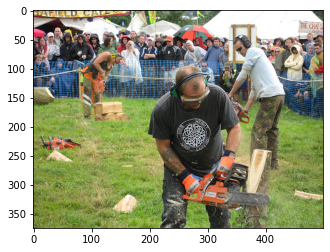

2398


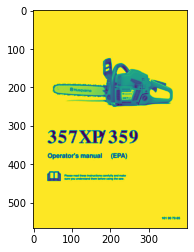

2308


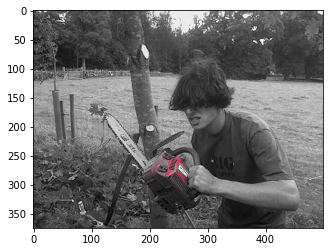

5563


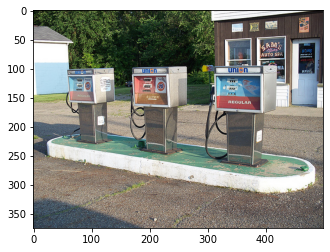

5038


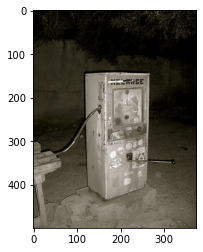

In [20]:
# retrieve most similar records
xc = index.query(
    xq,
    top_k=10,
    include_values=True,
    filter={"seen": 0}
)
# extract index and vector values
idx = [int(match['id']) for match in xc['matches']]
values = [match['values'] for match in xc['matches']]

# visualize the results
for i in idx:
    print(i)
    plt.imshow(imagenet[i]['image'])
    plt.show()

We will need keep iterating through several sets of images before finding the optimal query. So let's clean up our code a little starting with the tuning operation. All we'll do here is place all of the previous logic into a function called `tune`:

In [21]:
def tune(positives, xc, idx, update=True):
    # confirm any positives actually exist
    for i in positives:
        assert i in idx
    # extract positive and negative vectors
    negatives = [i for i in idx if i not in positives]
    positives = [
        match['values'] for match in xc['matches'] if int(match['id']) in positives
    ]
    negatives = [
        match['values'] for match in xc['matches'] if int(match['id']) in negatives
    ]
    # create target labels
    y = [1] * len(positives) + [0] * len(negatives)
    # create training inputs
    X = positives + negatives
    # train
    fit(X, y)
    # extract new query vector
    xq = model.weight.detach().numpy()[0].tolist()
    # and update the "seen" metadata
    if update:
        # we must update one record at a time
        for i in idx:
            index.update(str(i), set_metadata={"seen": 1})
    return xq

Now we update the model and query:

In [22]:
positives = []
xq = tune(positives, xc, idx)

  0%|          | 0/10 [00:00<?, ?it/s]

Now we return to retrieving more images. Again, let's collate all of the logic from before into a single `get_top_k` function:

In [23]:
def get_top_k(xq, top_k=10):
    # query the index
    xc = index.query(
        xq,
        top_k=top_k,
        include_values=True,
        filter={"seen": 0}
    )
    # extract IDs and vectors
    idx = [int(match['id']) for match in xc['matches']]
    values = [match['values'] for match in xc['matches']]
    # show retrieved images
    for i in idx:
        print(i)
        plt.imshow(imagenet[i]['image'])
        plt.show()
    return idx, xc

Now we retrieve those records:

6191


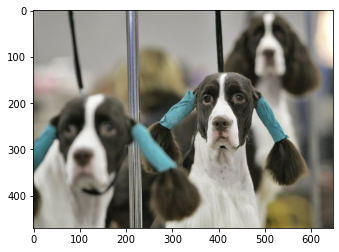

5704


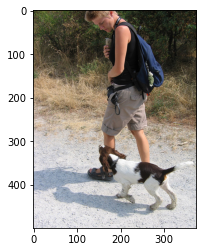

7187


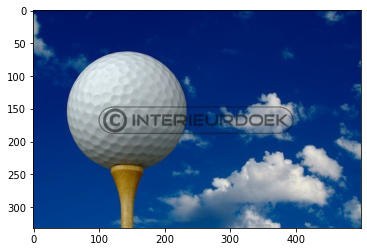

6997


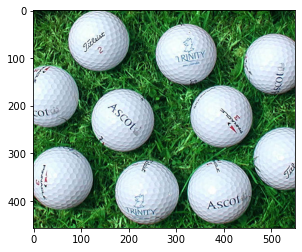

3512


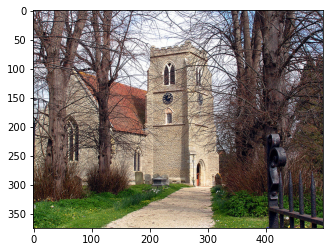

5731


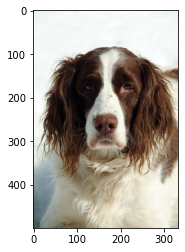

7176


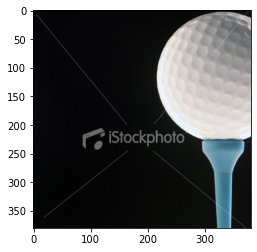

7005


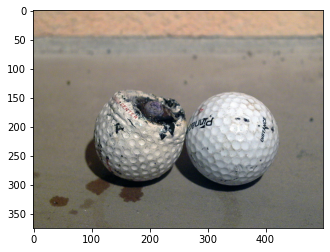

5707


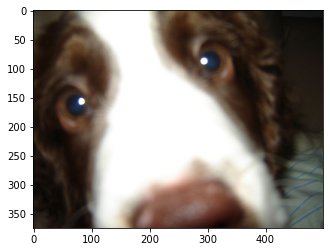

2515


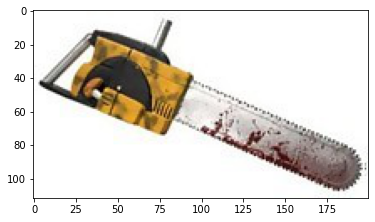

In [24]:
idx, xc = get_top_k(xq)

Again no positives, we need to repeat this process a few times...

  0%|          | 0/10 [00:00<?, ?it/s]

5678


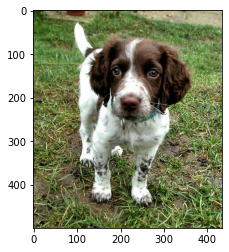

6579


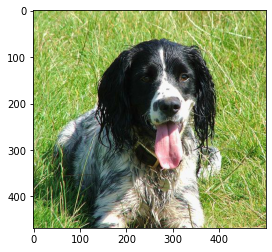

6338


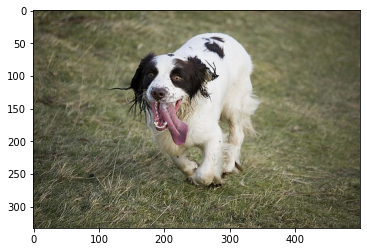

6595


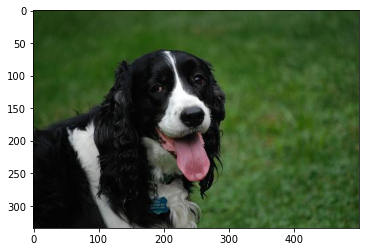

6199


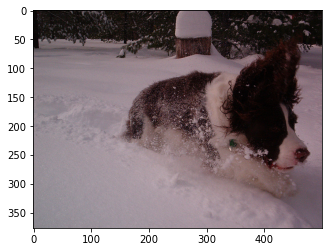

6448


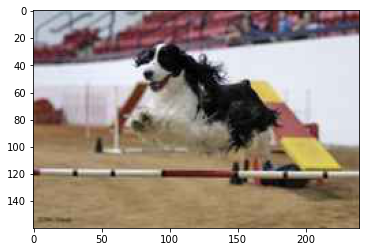

5993


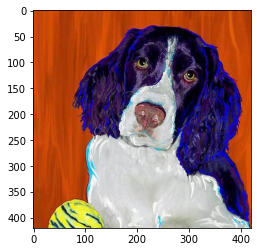

6488


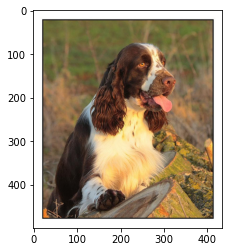

5947


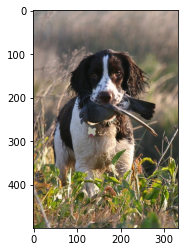

6216


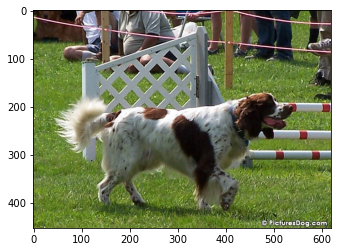

In [25]:
positives = [6191, 5704, 5731, 5707]
xq = tune(positives, xc, idx)
idx, xc = get_top_k(xq)

We now have our first dog images, so we add the `idx` values of these images to the `positives` list and repeat the training process.

  0%|          | 0/10 [00:00<?, ?it/s]

5806


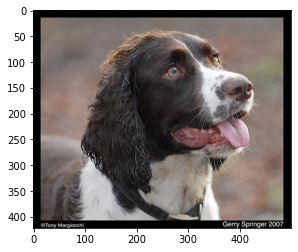

6023


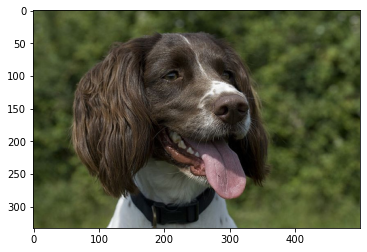

5725


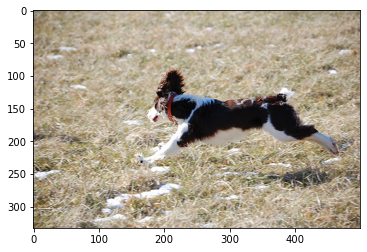

5853


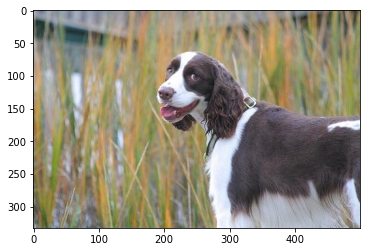

6518


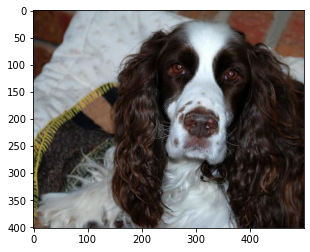

6169


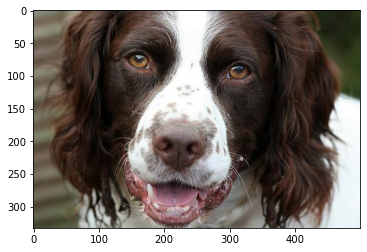

6367


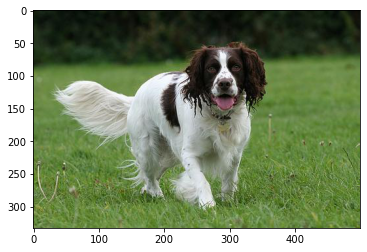

6381


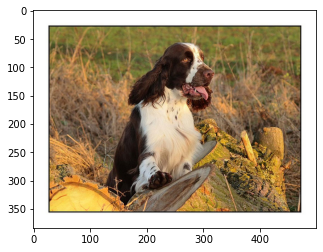

6584


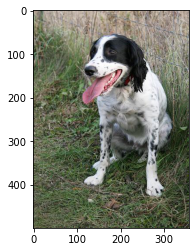

6560


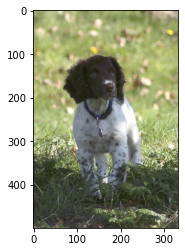

In [26]:
positives = idx
xq = tune(positives, xc, idx)
idx, xc = get_top_k(xq)

As we're performing multiple training steps with a relatively high learning rate (`lr`), the model is pretty responsive and moves quickly in the direction of more dogs as we can see. We add these to our `positives` list.

  0%|          | 0/10 [00:00<?, ?it/s]

6221


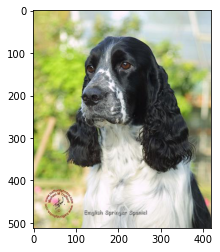

5910


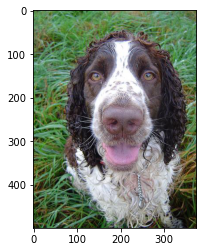

6255


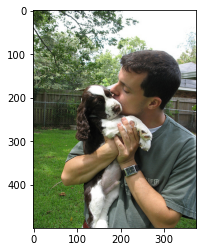

5939


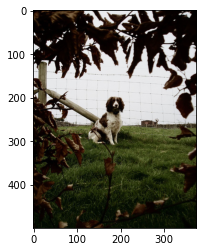

6170


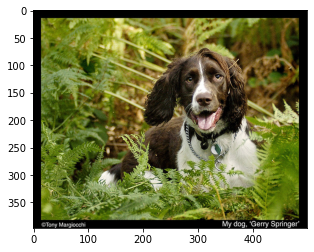

5862


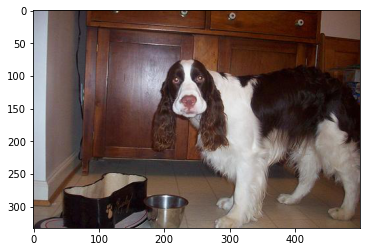

6596


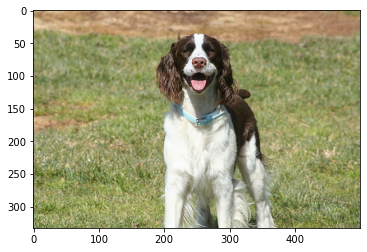

6018


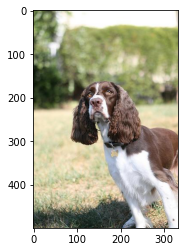

6106


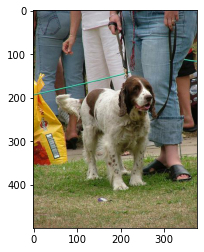

6034


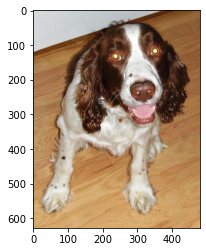

In [27]:
positives = idx
xq = tune(positives, xc, idx)
idx, xc = get_top_k(xq)

Our model is getting pretty good at producing dog queries already, and we can keep going; it will become better tuned to identifying dogs.

  0%|          | 0/10 [00:00<?, ?it/s]

5683


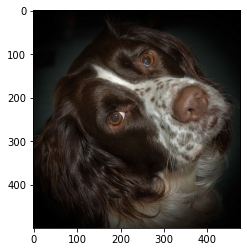

6498


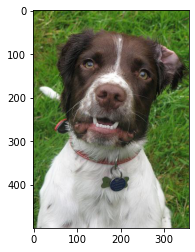

6444


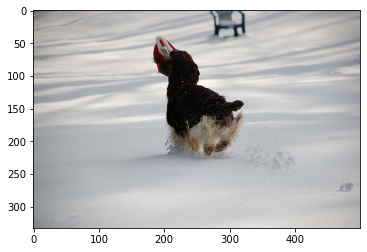

6142


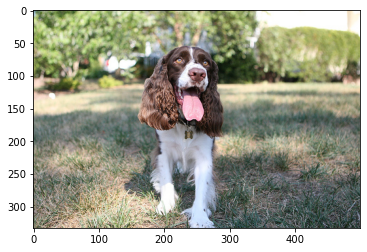

6089


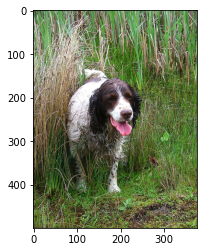

6231


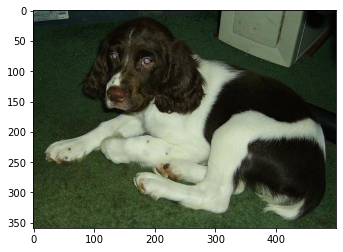

6336


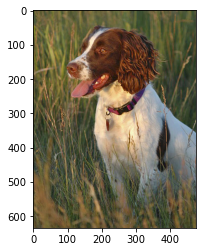

6086


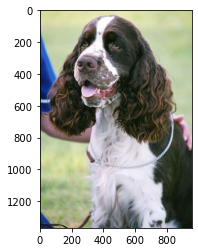

6145


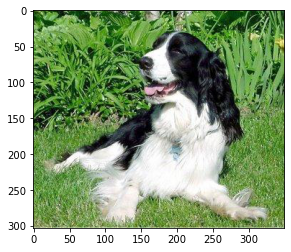

6179


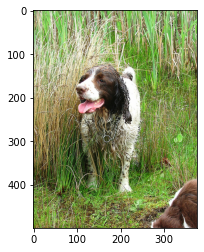

In [28]:
positives = idx
xq = tune(positives, xc, idx)
idx, xc = get_top_k(xq)

It's been very easy to fine-tune our query vector for finding dogs, so let's switch to dogs in snow with image `6444` and see what happens.

  0%|          | 0/10 [00:00<?, ?it/s]

5760


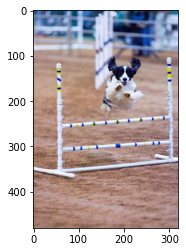

5658


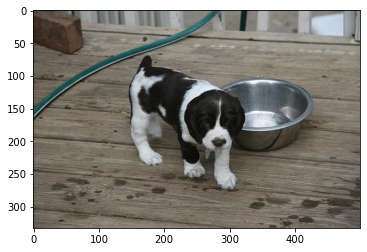

5878


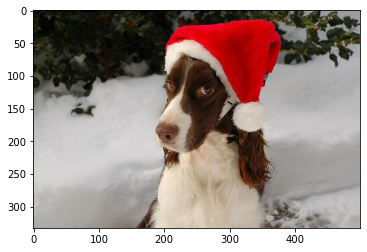

6500


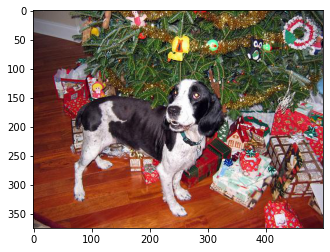

5930


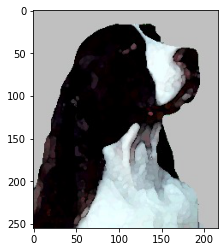

8681


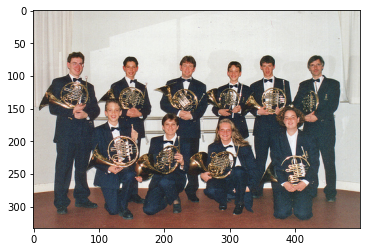

6368


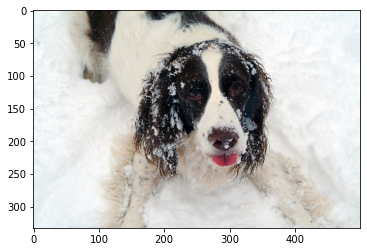

5967


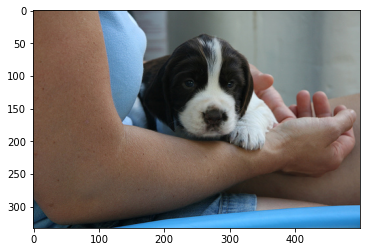

6164


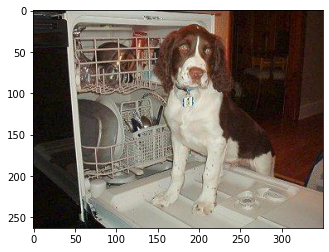

5880


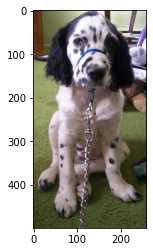

In [29]:
positives = [6444]
xq = tune(positives, xc, idx)
idx, xc = get_top_k(xq)

Over time the number of negative samples coming through our queries will become fewer.

  0%|          | 0/10 [00:00<?, ?it/s]

7595


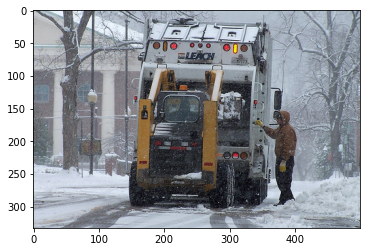

6069


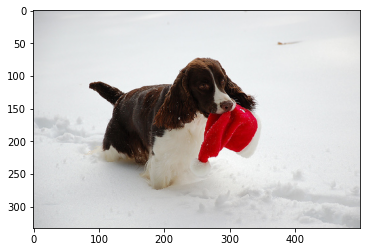

7672


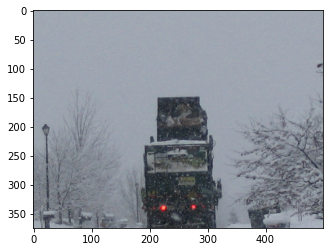

6251


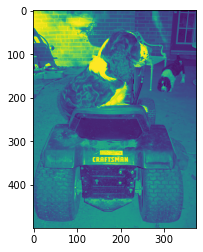

6377


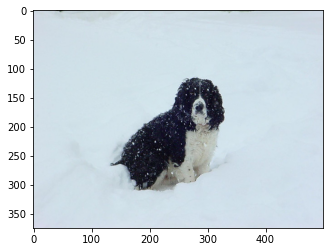

6443


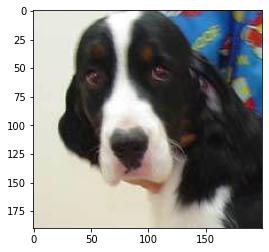

5990


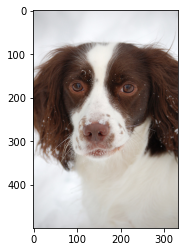

7861


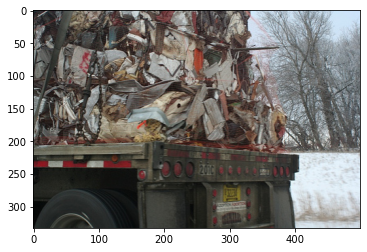

6532


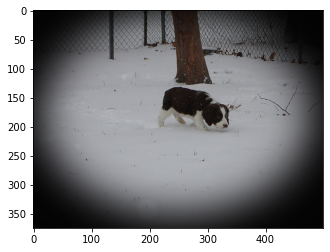

8130


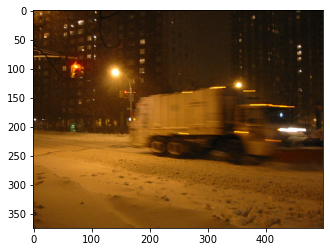

In [30]:
positives = [5878, 6368]
xq = tune(positives, xc, idx)
idx, xc = get_top_k(xq)

We're pulling in more dogs in the snow...

  0%|          | 0/10 [00:00<?, ?it/s]

5765


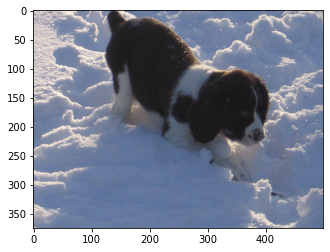

6105


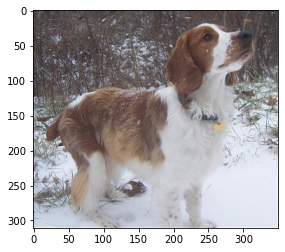

5921


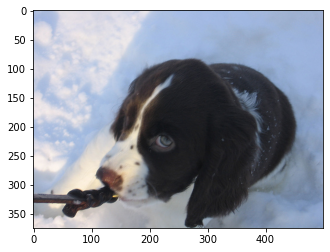

5812


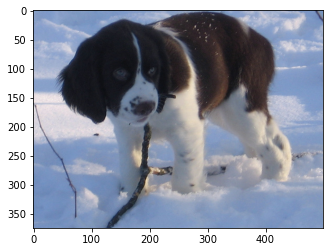

6458


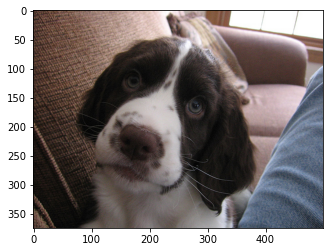

6155


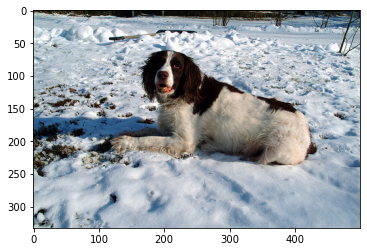

5881


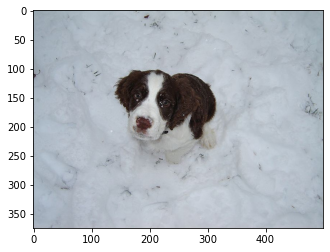

5818


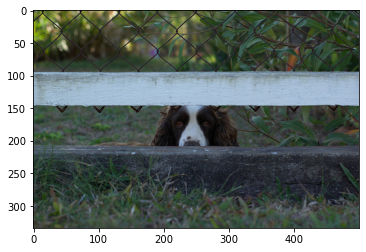

5733


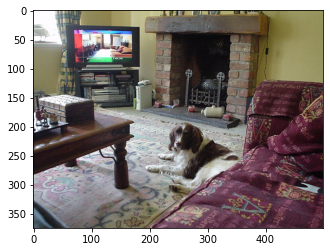

6555


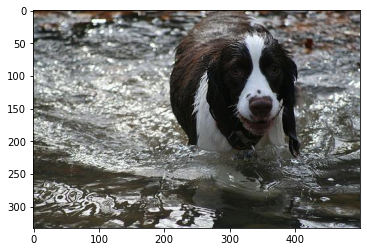

In [31]:
positives = [6069, 6377, 5990, 6532]
xq = tune(positives, xc, idx)
idx, xc = get_top_k(xq)

  0%|          | 0/10 [00:00<?, ?it/s]

5976


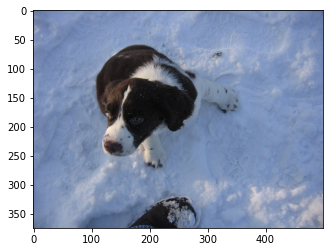

6469


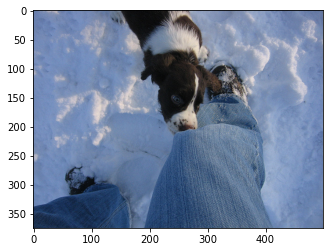

6573


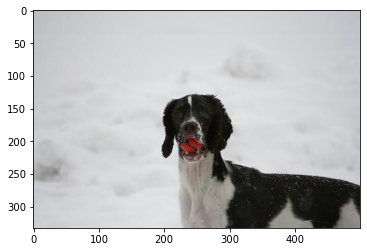

6031


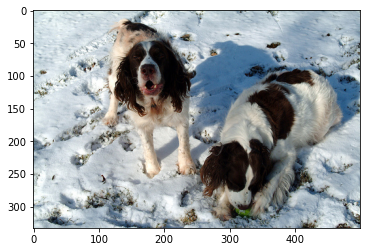

6078


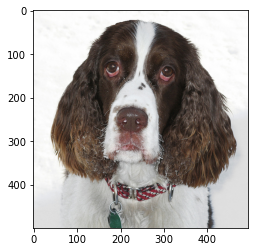

6313


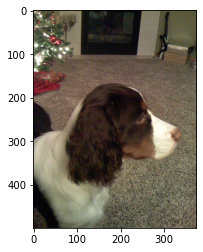

5752


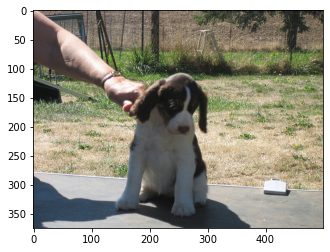

5987


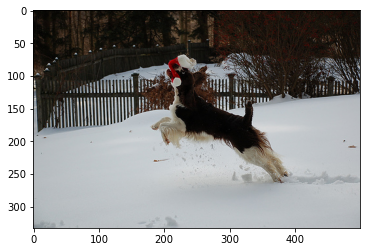

5875


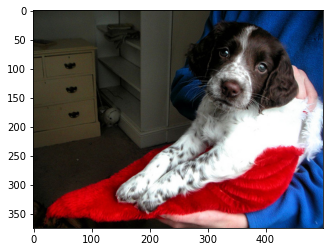

5876


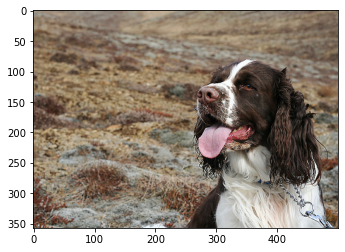

In [32]:
positives = [5765, 6105, 5921, 5812, 6155, 5881]
xq = tune(positives, xc, idx)
idx, xc = get_top_k(xq)

Okay, we get the point - we're returning a lot of pictures with dogs in the snow, our classifier weights are producing pretty good queries. We can continue training like this for a long time, we could even modify our search again. However, let's move on to searching without any filters to test the performance of our query. There are two options for searching without a filter:

* We drop the `filter` argument, this would not work if needing to perform a second iteration of training over the same data.
* We reset the filter values, switching all records where `{"seen": 1}` back to `{"seen": 0}`.

We will go ahead and take the second approach:

In [33]:
while True:
    xc = index.query(xq, top_k=100, filter={"seen": 1})
    idx = [match['id'] for match in xc['matches']]
    if len(idx) == 0: break
    for i in idx:
        index.update(str(i), set_metadata={"seen": 0})

Now if we search again, we will return a completely unfiltered view of the search results.

5704


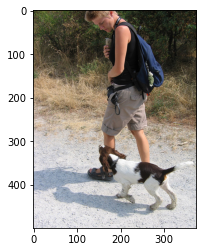

6199


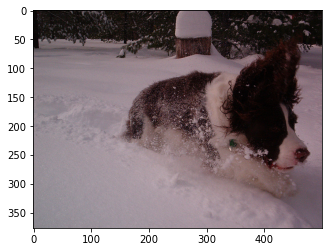

5765


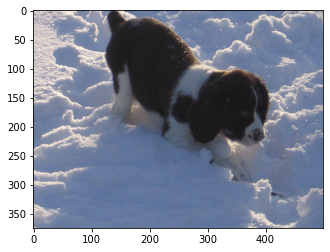

6368


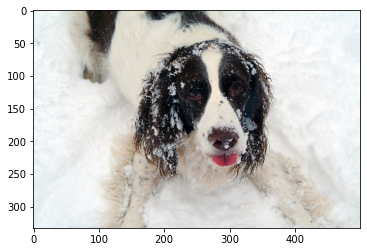

6377


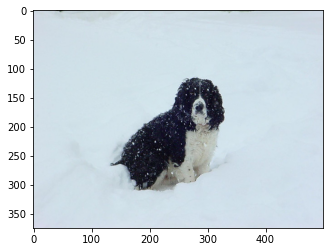

5878


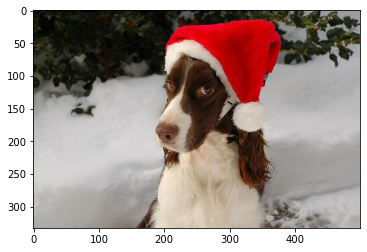

6069


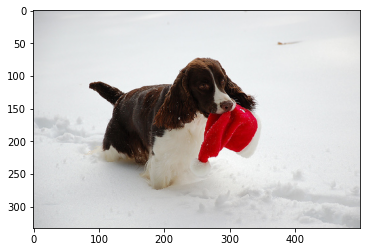

6105


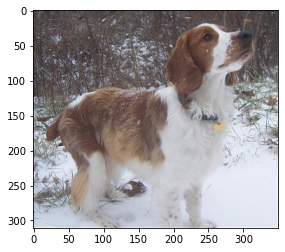

6191


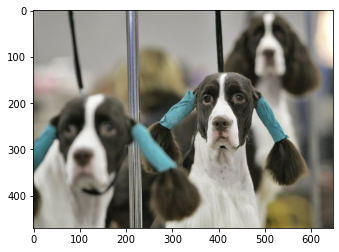

5812


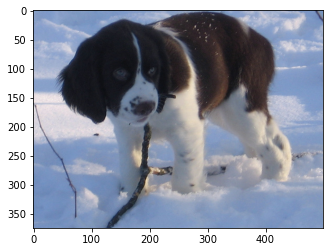

In [34]:
idx, xc = get_top_k(xq)

Plenty of dogs in the snow!

---